# Problem set 4


[Carmen Salazar]

[Using ipumsblack50 dataset] 

[03/28/2020]

In [1]:
*cd "/Users/karminsalazar/Desktop/Masters Thesis"

*set more off

*capture log close

*log using problem_set4log20200328.log

In [21]:
*use ipumsblack50, clear
describe


Contains data from ipumsblack50.dta
  obs:        27,319                          
 vars:            30                          18 Mar 2020 14:57
---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
              storage   display    value
variable name   type    format     label      variable label
---------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
year            int     %8.0g      YEAR       census year
statefip        byte    %8.0g      STATEFIP   state (fips code)
countyfip       int     %8.0g                 county (fips code)
city            int     %8.0g      CITY       city


## 1. Visually assess heteroscedasticity [1 pt]

    A. Create a scatterplot of a dependent variable and independent variable of interest from a dataset of your choice.
    
    B. Include a fitted line with an area graph of the confidence interval for the prediction.
    
    C. Write a couple sentences describing how the distribution of the data in the graph does or does not appear to be heteroscedastic.

In [42]:
*%set graph_format svg

In [58]:
quietly use ipumsblack50, clear
tw (scatter p_in_white p_black) ///
(lfitci p_in_white p_black),  ///
ytitle(Percent whites in 2017, size(large)) ///
xtitle(,size(large)) legend(off) scheme(538w)

Given our best fit line, the distribution of the data in the graph appears to be heteroscedastic. The best fit line is created to represent an expected value of y along that line for a given value of x. When assessing the variance of y, given x, we can see how the points at distance from the fitted line vary. Therefore, it appears the relationship between my dependent and independent variable suffer from heteroscedasticity. 

## 2. Test for heteroscedasticity [1 pt]

    A. Do a Breusch-Pagan postestimation test for heteroscedasticity in your dependent variable and independent variable relationship. (First without logging it)

    B. Reestimate the regression after logging the DV or IV if appropriate and do another Breusch-Pagan test. Does logging reduce heteroscedasticity?

In [59]:
quietly regress p_in_white p_black 
estat hettest




Breusch-Pagan / Cook-Weisberg test for heteroskedasticity 
         Ho: Constant variance
         Variables: fitted values of p_in_white

         chi2(1)      =  3859.78
         Prob > chi2  =   0.0000


In [60]:
gen p_blackln=log(p_black)
quietly regress p_in_white p_blackln
estat hettest





Breusch-Pagan / Cook-Weisberg test for heteroskedasticity 
         Ho: Constant variance
         Variables: fitted values of p_in_white

         chi2(1)      =  3750.33
         Prob > chi2  =   0.0000


Does logging reduce heteroscedasticity? 

Based on the outcomes of doing a Breusch-Pagan postestimation test for heteroscedasticity first without logging it and then logging it, it seems that logging did not really reduce heteroskedasticity. The chi2 on the first test was 3859.78, after logging it, chi2 was 3750.33. You would assume that as chi2 gets higher, it would be more probable that we can reject the null hypotheses of the constant variance based on this type of test. We would also expect the P value to be smaller. However, this was not the case as doing the test and logging the regression resulted in a decrease of chi2.


## 3. Boot strap your standard errors [1 pt.]

    A. Quietly reestimate your regression coefficient with convential OLS and store the results.
    
    B. Quietly reestimate your regression with bootstrapped standard errors and store the results.
    
    C. Use esttab to output the results of the two models and tell us how the bootstrap standard erros differ from the conventional results.
    
    D. Explain in your own words what the bootstrap procedure is doing and why it yields similar or different standard errors to the convential model.

In [16]:
ssc install stripplot

checking stripplot consistency and verifying not already installed...
all files already exist and are up to date.


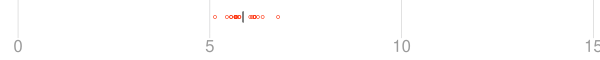

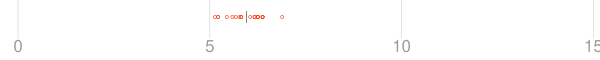

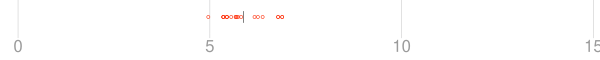

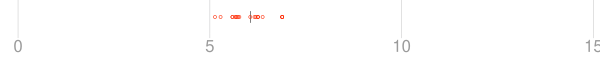

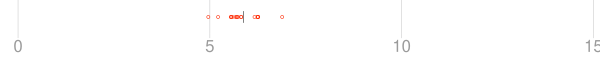

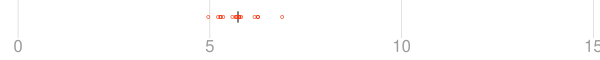

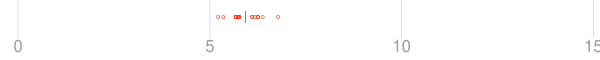

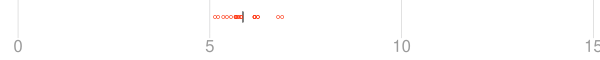

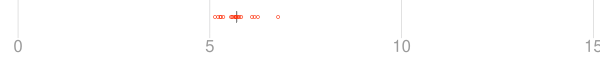

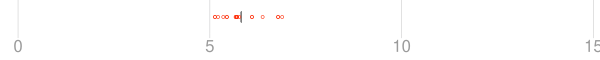
















. quietly {


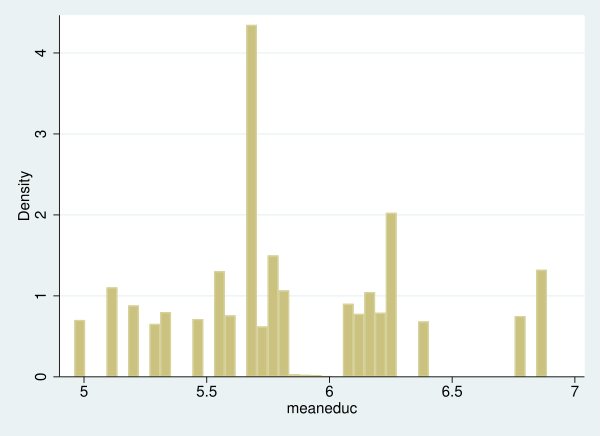

In [47]:
quietly use ipumsblack50, clear
quietly keep if meaneduc!=.
*quietly gen meaneduc=.
quietly gen n=_n
forvalues i=1/10 {
    quietly gen random=runiform()
    quietly sort random
    quietly stripplot meaneduc if _n<=20, scheme(538w) refline  ///
    ysize(1) xsize(10) scale(5) xtitle("") xlabel(0(5)15, labsize(vlarge)) 
    graph display, margins(zero)
    quietly sum meaneduc if _n<=20
    quietly replace meaneduc=r(mean) if n==`i'
    drop random
    }
quietly {
 forvalues i=11/200 {
    quietly gen random=runiform()
    quietly sort random    
    quietly sum meaneduc if _n<=20
    quietly replace meaneduc=r(mean) if n==`i'
    quietly drop random
}
quietly histogram meaneduc
}
graph display

In [61]:
est clear
quietly reg p_in_white p_black
quietly eststo
quietly bootstrap _b[p_black] , rep(1000) nodots : ///
   reg p_in_white p_black
quietly eststo



In [62]:
%html
esttab, html ///
mlabels("OLS" "Bootstrap") ///
collabels(none) drop(_cons) ///
cells(b(star fmt(3)) se(fmt(3) par)) ///
starlevels(^ .1 * .05 ** .01 *** .001) 

This front-end or document format cannot display HTML

Explain in your own words what the bootstrap procedure is doing and why it yields similar or different 
standard errors to the convential model:

The boostrap prcedure a test that relies on random sampling with replacement.Bootstrapping allows assigning
measures of accuracy defined in terms of variance, confidence intervals,standards errors to sample estimates.
Standard errors determine how accurate my estimation is. Focusing on the standard error coefficients, we can see there 
is no change in the standard errors. This means this current estimation of marginal errors is no good and we need to 
reestimate my model with robust standard errors to see a change in the current constant coefficients.

## 4. Estimate robust standard errors [1 pt]

    A. Reestimate your model with robust standard errors and store the results.
    
    B. Use esttab to output the results of the robust model alongside the conventional and bootstrap models and explain how the the results compare in 1 or 2 sentences.
    
    C. In your own words, explain how the robust standard errors procedure differs from conventional procedures.

In [63]:
reg p_in_white p_black, robust
quietly eststo
*pwcorr p_in_white meaneduc, sig 



Linear regression                               Number of obs     =     27,319
                                                F(1, 27317)       =   17820.03
                                                Prob > F          =     0.0000
                                                R-squared         =     0.2503
                                                Root MSE          =     .01771

------------------------------------------------------------------------------
             |               Robust
  p_in_white |      Coef.   Std. Err.      t    P>|t|     [95% Conf. Interval]
-------------+----------------------------------------------------------------
     p_black |  -.0918695   .0006882  -133.49   0.000    -.0932184   -.0905206
       _cons |    .090632   .0005369   168.82   0.000     .0895798    .0916843
------------------------------------------------------------------------------



In [65]:
%html
esttab, html ///
mlabels("OLS" "Bootstrap" "Robust") ///
collabels(none) drop(_cons) ///
cells(b(star fmt(4)) se(fmt(4) par)) ///
starlevels(^ .1 * .05 ** .01 *** .001) 

This front-end or document format cannot display HTML

In your own words, explain how the robust standard errors procedure differs from conventional procedures:

Unlike other conventional procedures, robust standard errors account for heteroskedasticity in a model’s unexplained 
variation. For example, if the amount of variation in the outcome variable is correlated with the explanatory variables, 
robust standard errors can take this correlation into account. In this outcome, we can see that the robust standard errors are the same for both robust and bootstrap but smaller from OLS regression. We can also see that the coefficient and bootstrap coefficient is the same for my variables of interest.

## 5. Cluster robust standard errors [1 pt]

    A. Explain why or why not your model should be estimated with cluster robust standard errors. If yes, what is the clustering unit and why?
    
    B. If yes, reestimate your model with cluster robust standard errors and use esttab to output the results of the robust model alongside your other models and explain how the the results compare in 1 or 2 sentences.
    
    C. Write a couple sentences explaining what is the best method of standard error estimation for your models and why.

A. My model should be estimated with cluster robust standard errors. Clustered standard errors are robust 
standard errors that account for heteroskedasticity across “clusters” of observations (i.e., states). My observtions are 
clustered into puma (public use microdata area) and my data is at the census tract level.

In [67]:
qui reg p_in_white p_black, cluster(puma) 
quietly eststo

In [68]:
%html
esttab, html ///
mlabels("OLS" "Bootstrap" "Robust" "Cluster") ///
collabels(none) drop(_cons) ///
cells(b(star fmt(4)) se(fmt(4) par)) ///
starlevels(^ .1 * .05 ** .01 *** .001) legend

This front-end or document format cannot display HTML

C. The best method of standard error estimation for my models is clustered standard erros. Because this kind of 
robust standard error accounts for heteroskedasticity across “clusters” of observations, the clustering is performed 
using the variable specified as the model’s fixed effects.Therefore, I expect my standard errors to be affected by 
puma (public use microdata areas). Clustered standard errors are also useful when analyzing data that includes 
observations of the same unit over time. We can also see a big difference in the coefficients when we ended up clustering. Based on the graph above, we notice there is no change in the boostrap and robust standard errors.
Instead, we get a larger cluster standard error of (0.0228) meaning this is a larger variability between the variables of interest.



